In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
import seaborn as sns
from matplotlib import pyplot as plt
from scipy import stats
import altair as alt
from altair import datum
import sys
sys.path.append('../')
from utils import *

In [2]:
df = pd.read_excel('../../01_Data/02_Processed/processed_v3.xlsx')
df = df[df.SCOR_SHARE < 1]
df.head()

,FACUL_NUM,DIVISION_NUM,TAG,SEGMENT_LOB,UF_STATUS,CT_STATUS,UWYEAR,CT_PERIOD,MARKET,MAIN_COUNTRY,SUBSECTOR,MAINOCCUPANCY,BUSINESSUNIT,UWCENTER,COVERAGE,PARTTYPE,GUARANTEE,MAIN_PRICING_CATEG,MAIN_PRICING_SUBCATEG,BI_TYPE,BI_PERIOD,INSUREDVALUEPD,INSUREDVALUEBI,TOTALINSUREDVALUE,NBLOCS,OIL,LIMIT,ATTACHMENT,SCOR_SHARE,PREMIUM,MODELED_CAT_EXPLOSS,DISCOUNTS,DEDUCTION,EXT_EXPENSE,WORDING,QUALITY_RISK_MGT,ASSET_QUALITY,BI_MITIGATION,MB_QUALITY,ORIGCCY,TXCHANGE,FXRATEUSD,TOP_MPL,TOP_FMLS,pd_bi,pd,bi,inception_year,inception_month,inception_duration,pricing_duration,diff,premium_level,UWR_cumultive,UWR_avg,UWY_first,YEAR,nb_state,ACCURACY_VALIDATE,YR_BLT,NO_OF_STRY,NO_OF_BLDG,IV_BUILDING,IV_CONTENT,IV_PD,IV_BI_VAL,TIV,INTEREST_DECLARATION,MPL_PD,MPL_PD_PERCEN,MPL_BI,MPL_BI_PERCEN,FMLS_PD,FMLS_PD_PERCEN,FMLS_BI,FMLS_BI_PERCEN,nb_category,LARGEST_UNIT_CAPACITY,EARTHQ_EXP,CYC_EXP,CYCPRO_EXP,FLD_EXP,MHZ_EXP,MHZPRO_EXP,VOL_EXP
0,02F062851,4,Bound,Ppty Non Energy,Active,Finalized,2019,12,ARGENTINA,Argentina,MINING COMPANY,Precious Metals Mines,BS Energy Mining,EMEA,"PD,BI",Excess of Loss,Unspecified,Mining - Hard Rock,Standard,Loss of profit,12.0,4.33e+08,1.81e+08,6.14e+08,1,0.0,3.59e+08,6.60e+06,0.10,51556.79,0.0,0.0,0.09,0.09,Standard,Average,Average,Average,NaN,USD,0.88,1.0,1.99e+08,NaN,NaN,0.9,30.0,2019,4,707,739,32,< 60K,0.46,6.88,12,2019,1,1.0,0.0,0,0,9.92e+08,5.13e+09,6.12e+09,2.31e+09,7.68e+09,19.0,2.00e+07,0.21,1.08e+07,5.26,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,69.63,0.0,69.63,0.0
1,11F008861,1,Bound,Ppty Non Energy,Active,Finalized,2017,12,CANADA,Argentina,MINING COMPANY,Precious Metals Mines,BS Energy Mining,CANADA,"PD,BI",Quota-Share,Unspecified,Mining - Hard Rock,Standard,Loss of profit,12.0,5.37e+08,1.64e+08,7.01e+08,3,0.0,1.86e+08,0.00e+00,0.07,101618.14,0.0,0.0,0.12,0.12,Standard,Average,Average,Average,NaN,USD,0.93,1.0,1.86e+08,NaN,NaN,0.5,30.0,2017,4,1408,1427,19,60K ~ 220K,0.07,0.47,5,2017,3,1.0,0.0,0,0,2.79e+08,2.99e+08,5.78e+08,1.76e+08,7.55e+08,3.0,2.89e+08,50.00,5.87e+07,100.00,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
2,02F062851,4,Bound,Ppty Non Energy,Active,Finalized,2018,12,ARGENTINA,Argentina,MINING COMPANY,Precious Metals Mines,BS Energy Mining,EMEA,"PD,BI",Excess of Loss,Unspecified,Mining - Hard Rock,Standard,Loss of profit,12.0,4.18e+08,2.40e+08,6.58e+08,1,0.0,3.43e+08,6.32e+06,0.10,45815.49,0.0,0.0,0.13,0.13,Standard,Average,Average,Average,NaN,USD,0.84,1.0,2.57e+08,NaN,NaN,0.8,30.0,2018,3,1103,1103,0,< 60K,0.46,6.88,12,2018,1,1.0,0.0,0,0,9.43e+08,4.88e+09,5.82e+09,2.35e+09,6.79e+09,18.0,2.00e+07,0.22,1.58e+07,5.56,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,69.52,0.0,69.52,0.0
3,FA0020462,1,Bound,Ppty Non Energy,Active,Finalized,2018,12,CANADA,Argentina,MINING COMPANY,Precious Metals Mines,BS Energy Mining,CANADA,"PD,BI",Quota-Share,Unspecified,Mining - Hard Rock,Standard,Loss of profit,12.0,4.90e+08,2.27e+08,7.17e+08,3,0.0,1.68e+08,0.00e+00,0.03,35547.13,0.0,0.0,0.11,0.11,Standard,Average,Average,Average,NaN,USD,0.84,1.0,2.29e+08,NaN,NaN,0.4,30.0,2018,6,982,983,1,< 60K,0.08,0.40,5,2018,3,1.0,0.0,0,0,9.31e+07,4.89e+08,5.82e+08,2.70e+08,8.52e+08,3.0,2.91e+08,50.00,8.99e+07,100.00,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
4,02F062851,4,Bound,Ppty Non Energy,Active,Finalized,2017,12,ARGENTINA,Argentina,MINING COMPANY,Precious Metals Mines,BS Energy Mining,EMEA,"PD,BI",Excess of Loss,Unspecified,Mining - Hard Rock,Standard,Loss of profit,12.0,4.53e+08,2.53e+08,7.06e+08,1,0.0,3.79e+08,6.97e+06,0.10,69669.24,0.0,0.0,0.14,0.14,Standard,Average,Average,Average,NaN,USD,0.93,1.0,2.35e+08,NaN,NaN,0.9,30.0,2017,3,1468,1469,1,60K ~ 220K,0.46,6.88,12,2017,1,1.0,0.0,0,0,1.33e+09,6.12e+09,7.45e+09,2.93e+09,8.54e+09,23.0,4.88e+07,0.43,8.89e+06,3.26,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,81.98,0.0,75.56,0.0


<AxesSubplot:>

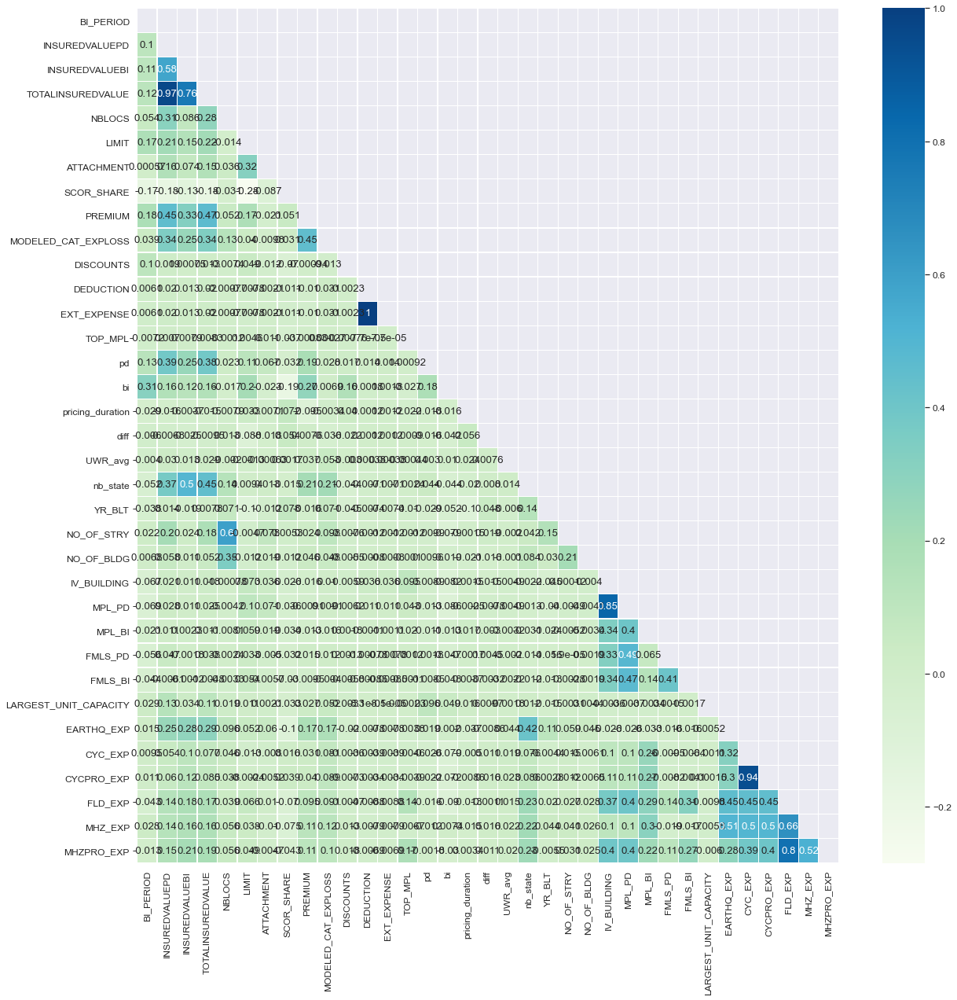

In [3]:
sns.set(font_scale=1.1)
fig = plt.figure(figsize=(20, 20))
corrmat = df[['BI_PERIOD', 'INSUREDVALUEPD', 'INSUREDVALUEBI','TOTALINSUREDVALUE', 'NBLOCS','LIMIT',
              'ATTACHMENT','SCOR_SHARE', 'PREMIUM', 'MODELED_CAT_EXPLOSS', 'DISCOUNTS','DEDUCTION', 'EXT_EXPENSE',
              'TOP_MPL','pd', 'bi','pricing_duration', 'diff', 'UWR_avg','nb_state', 'YR_BLT','NO_OF_STRY','NO_OF_BLDG',
              'IV_BUILDING', 'MPL_PD', 'MPL_BI','FMLS_PD', 'FMLS_BI','LARGEST_UNIT_CAPACITY',
              'EARTHQ_EXP','CYC_EXP', 'CYCPRO_EXP','FLD_EXP', 'MHZ_EXP', 'MHZPRO_EXP']].corr()
mask = np.zeros_like(corrmat)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corrmat, vmax=1, linewidths=.2, mask = mask , annot=True, cmap = "GnBu")

In general
- Insured **Total, PD, BI, Insured Value, and Modeled Cat Exp** have relatively higher positive correlation to Premium
- **Earthquake risk, Limit, and number of state** has moderate positive correlation to Premium

In [4]:
tmp = df[['BUSINESSUNIT','PREMIUM', 'TOTALINSUREDVALUE']].groupby(['BUSINESSUNIT']).mean().reset_index()
print(tmp)
alt.Chart(tmp, title='Premium by Business Unit').mark_bar().encode(
    alt.X('mean(PREMIUM)'), alt.Y('BUSINESSUNIT:O')
).properties(width=400,height=200)

          BUSINESSUNIT    PREMIUM  TOTALINSUREDVALUE
0     BS Energy Mining  266782.17           2.77e+09
1   BS Energy On-shore  252899.74           5.10e+09
2          BS Property  132865.06           4.67e+09
3  BS Property (Power)  121785.52           3.02e+09


alt.Chart(...)

- Mean premium is higher for 'Energy Mining' and 'Energy On-shore'

In [5]:
tmp = df[['UWCENTER','PREMIUM', 'TOTALINSUREDVALUE']].groupby(['UWCENTER']).mean().reset_index()
print(tmp)
alt.Chart(tmp, title='Premium by UWCENTER').mark_bar().encode(
    alt.X('UWCENTER:O'), alt.Y('mean(PREMIUM)')
).properties(width=400,height=200)

        UWCENTER    PREMIUM  TOTALINSUREDVALUE
0   ASIA PACIFIC   87445.35           2.17e+09
1         CANADA   96189.38           1.73e+09
2           EMEA  265154.17           7.19e+09
3  LATIN AMERICA   81135.25           1.03e+09
4  UNITED STATES  205875.60           5.81e+09


alt.Chart(...)

- mean premium value is relatively high for EMEA and United states

In [8]:
df['log_pm'] = df['PREMIUM'].apply(lambda x: np.log(x + 1))
df['log_tiv'] = df['TOTALINSUREDVALUE'].apply(lambda x: np.log(x + 1))
df['log_pdv'] = df['INSUREDVALUEPD'].apply(lambda x: np.log(x + 1))
df['log_biv'] = df['INSUREDVALUEBI'].apply(lambda x: np.log(x + 1))
df['log_mcl'] = df['MODELED_CAT_EXPLOSS'].apply(lambda x: np.log(x + 1))
df['log_lm'] = df['LIMIT'].apply(lambda x: np.log(x + 1))
df['log_dd'] = df['DEDUCTION'].apply(lambda x: np.log(x + 1))

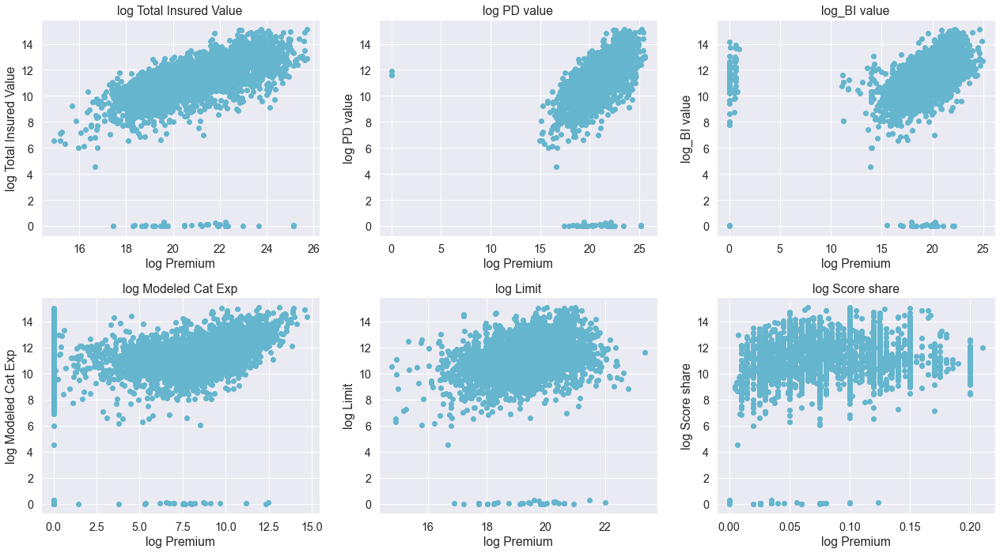

In [34]:
# plot line plot
sns.set(font_scale=1.3)
fig, ax = plt.subplots(2,3, figsize=(18,10))
values = ['log_tiv','log_pdv','log_biv','log_mcl','log_lm','SCOR_SHARE']
names = ['log Total Insured Value', 'log PD value', 'log_BI value','log Modeled Cat Exp','log Limit','log Score share']
i = 0
for r in range(2):
    for c in range(3):
        ax[r,c].scatter(values[i], 'log_pm', data=df, color="c")
        ax[r,c].set_title(names[i])
        ax[r,c].set_xlabel('log Premium')
        ax[r,c].set_ylabel(names[i])
        i += 1
plt.tight_layout()

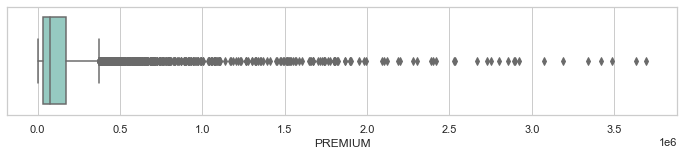

In [48]:
plt.figure(figsize=(12,2))
sns.set(style="whitegrid")
ax = sns.boxplot(x="PREMIUM", data=df, palette="Set3")

In [36]:
df.describe()

,DIVISION_NUM,UWYEAR,CT_PERIOD,BI_PERIOD,INSUREDVALUEPD,INSUREDVALUEBI,TOTALINSUREDVALUE,NBLOCS,OIL,LIMIT,ATTACHMENT,SCOR_SHARE,PREMIUM,MODELED_CAT_EXPLOSS,DISCOUNTS,DEDUCTION,EXT_EXPENSE,TXCHANGE,FXRATEUSD,TOP_MPL,TOP_FMLS,pd_bi,pd,bi,inception_year,inception_month,inception_duration,pricing_duration,diff,UWR_cumultive,UWR_avg,UWY_first,YEAR,nb_state,ACCURACY_VALIDATE,YR_BLT,NO_OF_STRY,NO_OF_BLDG,IV_BUILDING,IV_CONTENT,IV_PD,IV_BI_VAL,TIV,INTEREST_DECLARATION,MPL_PD,MPL_PD_PERCEN,MPL_BI,MPL_BI_PERCEN,FMLS_PD,FMLS_PD_PERCEN,FMLS_BI,FMLS_BI_PERCEN,nb_category,LARGEST_UNIT_CAPACITY,EARTHQ_EXP,CYC_EXP,CYCPRO_EXP,FLD_EXP,MHZ_EXP,MHZPRO_EXP,VOL_EXP,log_pm,log_tiv,log_pdv,log_biv,log_mcl,log_lm,log_dd
count,5191.00,5191.00,5191.00,4467.00,5.19e+03,4.46e+03,5.19e+03,5191.00,5190.00,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.18e+03,1.64e+03,1051.00,4081.00,3325.00,5191.00,5191.00,5191.00,5191.00,5191.00,5.17e+03,5172.00,5191.00,5191.00,5191.00,5191.00,5191.00,5191.00,5191.00,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5191.00,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5.19e+03,5191.00,5.19e+03,5191.00,5191.00,5191.00,5191.00,5191.00,5191.00,5191.00,5.19e+03,5191.00,5.19e+03,4.46e+03,5191.00,5191.00,5.19e+03
mean,1.12,2018.35,12.15,15.90,3.50e+09,9.55e+08,4.32e+09,351.54,0.02,4.04e+08,1.68e+07,8.36e-02,1.68e+05,2.33e+04,4.75e-03,8.89e+04,8.89e+04,9.41e-01,1.06e+00,1.11e+09,2.81e+08,3.82,1.54,28.41,2018.36,6.26,860.76,825.42,-35.34,8.74e-01,5.53,4.99,2018.35,7.15,0.95,216.69,132.28,36.18,4.14e+10,1.23e+11,1.65e+11,2.91e+10,1.33e+11,310.52,8.59e+10,1.01e+05,4.80e+09,4.23e+06,6.22e+09,4.39e+02,2.52e+09,4.13e+04,2.03,1.02e+03,10.06,5.76,5.05,21.20,13.54,14.46,0.59,1.12e+01,20.68,2.04e+01,1.86e+01,5.84,19.29,1.51e-01
std,0.67,1.02,1.43,6.82,9.16e+09,3.38e+09,1.11e+10,3302.04,0.12,5.35e+08,1.33e+08,3.94e-02,3.03e+05,8.66e+04,3.81e-02,4.93e+06,4.93e+06,2.96e+00,3.35e+00,3.05e+10,3.20e+09,12.36,8.60,20.10,1.02,3.34,367.74,362.42,85.83,1.06e+01,97.37,3.54,1.02,14.50,0.15,527.57,1940.58,820.69,3.24e+11,1.04e+12,1.32e+12,3.24e+11,1.27e+12,2657.15,7.91e+11,7.22e+06,6.24e+10,2.99e+08,1.32e+11,2.54e+04,5.35e+10,2.04e+06,1.69,2.17e+04,22.25,22.34,21.36,41.02,29.15,34.82,4.30,1.56e+00,1.68,1.75e+00,3.04e+00,4.39,1.06,7.19e-01
min,1.00,2017.00,1.00,0.00,9.29e-04,1.77e-05,2.97e+06,1.00,0.00,2.60e+06,0.00e+00,1.00e-07,4.49e-04,0.00e+00,0.00e+00,0.00e+00,0.00e+00,3.71e-05,4.29e-05,1.28e+05,0.00e+00,0.00,0.00,0.00,2017.00,1.00,158.00,227.00,-929.00,0.00e+00,0.00,1.00,2017.00,1.00,0.00,0.00,0.00,0.00,0.00e+00,0.00e+00,1.25e+06,0.00e+00,0.00e+00,0.34,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,1.00,0.00e+00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.49e-04,14.91,9.29e-04,1.77e-05,0.00,14.77,0.00e+00
25%,1.00,2017.00,12.00,12.00,2.24e+08,4.61e+07,2.81e+08,1.00,0.00,1.16e+08,0.00e+00,5.00e-02,3.53e+04,0.00e+00,0.00e+00,7.85e-03,1.01e-02,6.47e-01,7.36e-01,1.04e+08,3.16e+07,0.10,0.10,7.00,2018.00,4.00,554.00,514.00,-34.00,0.00e+00,0.00,3.00,2017.00,1.00,0.98,0.00,0.00,0.00,8.81e+07,2.62e+08,4.40e+08,3.80e+07,2.28e+08,1.00,2.10e+08,4.00e+01,1.81e+06,4.98e+01,0.00e+00,0.00e+00,0.00e+00,0.00e+00,1.00,0.00e+00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.05e+01,19.45,1.92e+01,1.76e+01,0.00,18.57,7.82e-03
50%,1.00,2018.00,12.00,12.00,6.04e+08,1.51e+08,7.73e+08,6.00,0.00,2.45e+08,0.00e+00,7.50e-02,7.72e+04,1.45e+03,0.00e+00,7.87e-02,8.31e-02,8.42e-01,1.00e+00,2.35e+08,6.85e+07,0.50,0.20,30.00,2018.00,6.00,851.00,812.00,-6.00,3.70e-03,0.02,4.00,2018.00,1.00,1.00,0.00,0.00,0.00,3.48e+08,9.61e+08,1.52e+09,2.13e+08,1.06e+09,7.00,7.35e+08,7.50e+01,1.42e+07,1.00e+02,0.00e+00,0.00e+00,0.00e+00,0.00e+00,1.00,0.00e+00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.13e+01,20.47,2.02e+01,1.88e+01,7.28,19.32,7.58e-02
75%,1.00,2019.00,12.00,18.00,2.19e+09,5.33e+08,2.76e+09,46.50,0.00,4.80e+08,0.00e+00,1.00e-01,1.69e+05,1.39e+04,0.00e+00,1.80e-01,1.86e-01,9.03e-01,1.00e+00,5.30e+08,1.67e+08,2.10,0.80,45.00,20

In [35]:
tmp = df[(df.premium_level=='> 220K')| (df.premium_level=='< 60K')]
alt.Chart(tmp, title='Premium Level by Industry').mark_bar().encode(
    alt.X('count()',stack='normalize'), alt.Y('MAIN_PRICING_CATEG'), color='premium_level'
).properties(width=500,height=500)

alt.Chart(...)

In [33]:
tmp = df[(df.premium_level=='> 220K')| (df.premium_level=='< 60K')]
tmp = tmp[(tmp.MAIN_PRICING_CATEG =='Crude Processing - Refining')
           |  (tmp.MAIN_PRICING_CATEG =='Mining - Underground coal')
          |  (tmp.MAIN_PRICING_CATEG =='Food producers')
          |  (tmp.MAIN_PRICING_CATEG =='Aerospace & Defence')
           | (tmp.MAIN_PRICING_CATEG =='Infrastructure')
           | (tmp.MAIN_PRICING_CATEG =='Textile industry')]
alt.Chart(tmp, title='Premium Level by Industry').mark_bar().encode(
    alt.X('MAIN_PRICING_CATEG'), alt.Y('count()',stack='normalize'), color='premium_level'
).properties(width=300,height=200).configure_axis(
    labelFontSize=15,
    titleFontSize=15
)

alt.Chart(...)

- Mining - Underground coal and Crude Processing - Refining have relatively high premium
- Texitile industry, Mining - other, and Infrastructure has relatively lower premiums

In [35]:
alt.Chart(tmp, title='Premium Level by Industry').mark_bar().encode(
    alt.X('MARKET:O'), alt.Y('count()',stack='normalize'), color='premium_level'
).properties(width=1200,height=200)

alt.Chart(...)

- Indeed, EMEA has mix of high and low premium accounts, thus the model should use detailed region information

### Check the correlation of each country and industry to premium

In [36]:
qc = df[df.MAIN_COUNTRY.isin(df.MAIN_COUNTRY.value_counts()[df.MAIN_COUNTRY.value_counts()>=5].index)].MAIN_COUNTRY
qi = df[df.SUBSECTOR.isin(df.SUBSECTOR.value_counts()[df.SUBSECTOR.value_counts()>=5].index)].SUBSECTOR

qc.drop_duplicates(inplace=True)
qi.drop_duplicates(inplace=True)

dfqi = df[df.SUBSECTOR.isin(qi)]
dfqi = dfqi[['PREMIUM','Main']]
dfqi_ = pd.get_dummies(dfqi)

dfqc = df[df.MAIN_COUNTRY.isin(qc)]
dfqc = dfqc[['PREMIUM','MAIN_COUNTRY']]
dfqc_ = pd.get_dummies(dfqc)

<ipython-input-36-152149ab940b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qc.drop_duplicates(inplace=True)
<ipython-input-36-152149ab940b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  qi.drop_duplicates(inplace=True)


In [37]:
corr_qi = pd.DataFrame(dfqi_[dfqi_.columns[0:]].corr()['PREMIUM'][:]).rename(columns = {"PREMIUM":"Correlation to Premium"})
cat_pos = corr_qi.sort_values(by='Correlation to Premium', axis=0, ascending=False).head(25).reset_index()
cat_pos.index += 1
cat_pos.style.background_gradient(cmap="GnBu")

,index,Correlation to Premium
1,PREMIUM,1.00
2,"SUBSECTOR_INTEGRATED CO,CONGLOMERATE",0.13
3,SUBSECTOR_ONSHORE CO & CHEMICAL CO,0.09
4,SUBSECTOR_MINING COMPANY,0.09
5,SUBSECTOR_AEROSPACE & DEFENCE,0.03
6,SUBSECTOR_OFFSHORE (E&P) COMPANY,0.02
7,SUBSECTOR_ENVIRONMENTAL SERV. & IND.,0.01
8,SUBSECTOR_HIGH TECH. INDUSTRIES,0.01
9,SUBSECTOR_HEAVY INDUSTRIES,0.00
10,SUBSECTOR_HEALTHCARE,0.00


In [16]:
corr_qi = pd.DataFrame(dfqi_[dfqi_.columns[0:]].corr()['PREMIUM'][:]).rename(columns = {"PREMIUM":"Correlation to Premium"})
cat_pos = corr_qi.sort_values(by='Correlation to Premium', axis=0).head(25).reset_index()
cat_pos.index += 1
cat_pos.style.background_gradient(cmap="GnBu")

,index,Correlation to Premium
1,SUBSECTOR_TRANSPORTATION & LOGISTICS,-0.06
2,SUBSECTOR_CORPORATE PROPERTY & CASUALTY,-0.06
3,SUBSECTOR_CONSUMER GOODS,-0.06
4,SUBSECTOR_ENERGY & NATURAL RESOURCES,-0.05
5,SUBSECTOR_POWER & UTILITY COMPANY,-0.05
6,SUBSECTOR_OTHER INDUSTRIES,-0.04
7,SUBSECTOR_FINANCIAL INSTITUTIONS,-0.03
8,SUBSECTOR_PROFESSIONAL SERVICES,-0.03
9,SUBSECTOR_OTHER SERVICES,-0.02
10,SUBSECTOR_AGRICULTURAL/LIFE SCIENCES,-0.02


In [17]:
corr_qc = pd.DataFrame(dfqc_[dfqc_.columns[0:]].corr()['PREMIUM'][:]).rename(columns = {"PREMIUM":"Correlation to Premium"})
cat_pos = corr_qc.sort_values(by='Correlation to Premium', axis=0, ascending=False).head(25).reset_index()
cat_pos.index += 1
cat_pos.style.background_gradient(cmap="GnBu")

,index,Correlation to Premium
1,PREMIUM,1.00
2,MAIN_COUNTRY_UNITED STATES,0.15
3,MAIN_COUNTRY_Jamaica,0.05
4,MAIN_COUNTRY_France,0.05
5,MAIN_COUNTRY_South Africa,0.05
6,MAIN_COUNTRY_Venezuela,0.04
7,MAIN_COUNTRY_Italy,0.04
8,MAIN_COUNTRY_Spain,0.04
9,MAIN_COUNTRY_Algeria,0.04
10,MAIN_COUNTRY_United Arab Emirates,0.04


In [18]:
neg = corr_qc.sort_values(by='Correlation to Premium', axis=0).head(50).reset_index()
neg.index += 1
neg.style.background_gradient(cmap="GnBu")

,index,Correlation to Premium
1,MAIN_COUNTRY_China,-0.08
2,MAIN_COUNTRY_Thailand,-0.07
3,MAIN_COUNTRY_Indonesia,-0.05
4,MAIN_COUNTRY_Canada,-0.05
5,MAIN_COUNTRY_Philippines,-0.05
6,MAIN_COUNTRY_Argentina,-0.04
7,MAIN_COUNTRY_Malaysia,-0.04
8,MAIN_COUNTRY_Colombia,-0.04
9,MAIN_COUNTRY_Pakistan,-0.04
10,MAIN_COUNTRY_South Korea,-0.04
